**Problem Statement:** The challenge at hand is to design a highly effective system utilizing artificial intelligence (AI) to detect vehicles for traffic surveillance, leveraging the cutting-edge PP-YOLO-Enhanced object detection model. The task involves the precise identification and continuous tracking of vehicles in real-time from surveillance footage, with the overarching goal of enhancing traffic management strategies, bolstering safety measures, and supporting law enforcement efforts.

**Goal:** The primary objective is to deploy a resilient AI-driven vehicle detection framework utilizing the PP-YOLO-Enhanced model, ensuring both exceptional accuracy and swift real-time performance. This system's core purpose is to significantly improve traffic surveillance capabilities by delivering precise vehicle enumeration, classification, and tracking functionalities. These capabilities are crucial for optimizing traffic flow, promptly identifying incidents, and enhancing overall traffic management efficiency, ultimately leading to safer and more organized road networks.

In [ ]:
!pip install super-gradients
!pip install --upgrade pillow
!pip install --upgrade torchvision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 42.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 38.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 71.5 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 29.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 84.8 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 78.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 6.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) 

First, the command `!pip install super-gradients` is used to install the "super-gradients" package, which likely provides enhanced functionality or methods related to gradient computations in machine learning or optimization tasks. Second, `!pip install --upgrade pillow` upgrades the Python Imaging Library (PIL) to Pillow, which is a fork of PIL that offers improved features and support. Finally, `!pip install --upgrade torchvision` upgrades the torchvision package, which provides utilities for working with image data in PyTorch, including datasets, transforms, and models.

In [ ]:
import os
import random
import torch
from PIL import Image

from super_gradients.training import Trainer, dataloaders, models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)
from super_gradients.training.models.detection_models.pp_yolo_e import (
    PPYoloEPostPredictionCallback
)

import warnings

[2023-09-20 18:55:25] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2023-09-20 18:55:25] WARNING - __init__.py - Failed to import pytorch_quantization
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
[2023-09-20 18:55:37] INFO - utils.py - NumExpr defaulting to 2 threads.
/opt/conda/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-09-20 18:55:42] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-09-20 18:55:42] WARNING - export.py - Failed to import pytorch_quantization
[2023-09-20 18:55:42] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-09-20 18:55:42] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2023-09-20 18:55:42] WA

This code snippet is setting up an environment for a deep learning project related to object detection, particularly using the PP-YOLO-Enhanced model. It imports necessary modules such as Trainer, dataloaders, and models from the super_gradients package, along with specific components like PPYoloELoss for defining the loss function and DetectionMetrics_050 for evaluation metrics. The warnings indicate potential issues with package imports (e.g., pytorch_quantization, scipy version compatibility), missing required packages (e.g., coverage, sphinx), and failed verifications for essential libraries needed for the project's functionality (e.g., hydra-core, pycocotools). These warnings suggest that certain dependencies or configurations may need attention or correction to ensure the smooth execution of the project.

In [ ]:
class Config:
    CHECKPOINT_DIR = 'checkpoints'
    EXPERIMENT_NAME = 'finding-battleships'
    DATA_DIR = '/kaggle/input/traffic-detection-project'
    TRAIN_IMAGES_DIR = 'train/images'
    TRAIN_LABELS_DIR = 'train/labels'
    VAL_IMAGES_DIR = 'valid/images'
    VAL_LABELS_DIR = 'valid/labels'
    TEST_IMAGES_DIR = 'test/images'
    TEST_LABELS_DIR = 'test/labels'
    CLASSES = ['bicycle', 'bus', 'car', 'motorbike', 'person']
    NUM_CLASSES = len(CLASSES)
    DATALOADER_PARAMS = {
        'batch_size': 16,
        'num_workers': 2
    }
    MODEL_NAME = 'yolo_nas_l'
    PRETRAINED_WEIGHTS = 'coco'

This class `Config` serves as a centralized configuration container for a traffic detection project. It defines various parameters such as the directory paths for checkpoints, data storage, training, validation, and testing images and labels. Additionally, it specifies the classes of objects the model will detect (e.g., bicycle, bus, car, motorbike, person) and calculates the number of classes automatically. The class also includes parameters for data loading, like batch size and the number of workers for data preprocessing. Lastly, it specifies the model architecture (`MODEL_NAME`) to be used and the option for loading pretrained weights from the COCO dataset (`PRETRAINED_WEIGHTS`). Overall, this configuration class organizes essential project settings for data handling, model architecture, and training configurations in a structured and accessible manner.

[2023-09-20 18:55:43] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 5805/5805 [01:20<00:00, 71.98it/s]
[2023-09-20 18:57:04] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 549/549 [00:05<00:00, 108.05it/s]
[2023-09-20 18:57:10] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 279/279 [00:02<00:00, 112.33it/s]


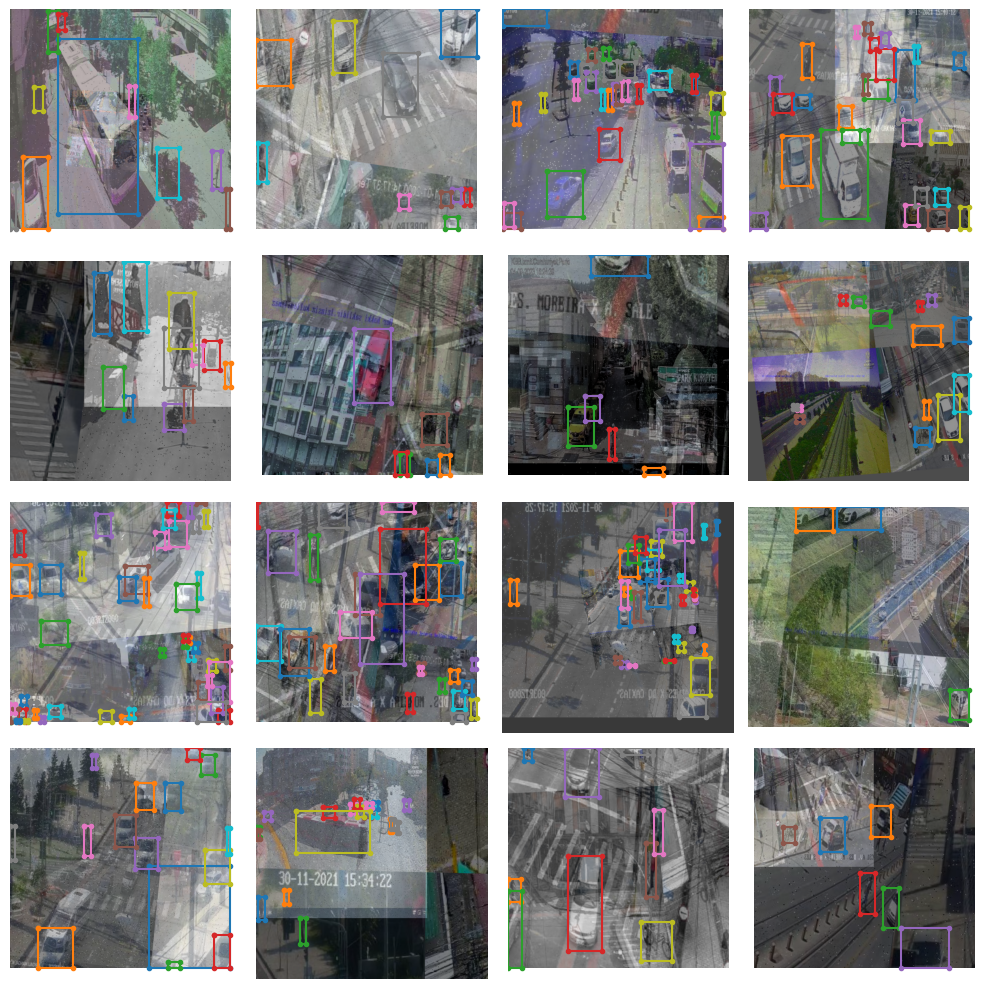

In [ ]:
# Initialize Trainer
trainer = Trainer(experiment_name=Config.EXPERIMENT_NAME,
                  ckpt_root_dir=Config.CHECKPOINT_DIR)

Config.DATALOADER_PARAMS['batch_size'] = 8  # Reduce batch size to 8


# Load Data with the updated batch size
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': Config.DATA_DIR,
        'images_dir': Config.TRAIN_IMAGES_DIR,
        'labels_dir': Config.TRAIN_LABELS_DIR,
        'classes': Config.CLASSES
    },
    dataloader_params=Config.DATALOADER_PARAMS
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': Config.DATA_DIR,
        'images_dir': Config.VAL_IMAGES_DIR,
        'labels_dir': Config.VAL_LABELS_DIR,
        'classes': Config.CLASSES
    },
    dataloader_params=Config.DATALOADER_PARAMS
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': Config.DATA_DIR,
        'images_dir': Config.TEST_IMAGES_DIR,
        'labels_dir': Config.TEST_LABELS_DIR,
        'classes': Config.CLASSES
    },
    dataloader_params=Config.DATALOADER_PARAMS
)

# Check train data (visualization)
train_data.dataset.plot()

 a `Trainer` object is initialized using the `Config.EXPERIMENT_NAME` and `Config.CHECKPOINT_DIR` parameters, setting up a framework for training the traffic detection model. The batch size in the `Config.DATALOADER_PARAMS` dictionary is then updated to 8. This adjustment reduces the batch size used during data loading, which can impact training speed and memory usage.

Next, data loading is performed using the `coco_detection_yolo_format_train` and `coco_detection_yolo_format_val` functions, which are likely custom functions for preparing data in the YOLO format specific to this project. These functions load training, validation, and testing data from directories specified in the `Config` class, using the updated batch size from `Config.DATALOADER_PARAMS`. The `plot()` method is then called on the training data to visualize a sample of the dataset. The log messages indicate the progress of dataset initialization and indexing, with a note about the potential longer processing time when caching annotations (`cache_annotations=True`) due to indexing the full dataset.



In [ ]:
# Load Model (on single GPU)
model = models.get(Config.MODEL_NAME,
                   num_classes=Config.NUM_CLASSES,
                   pretrained_weights=Config.PRETRAINED_WEIGHTS
                   )
model.to('cuda')

[2023-09-20 18:57:17] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:08<00:00, 31.8MB/s] 
[2023-09-20 18:57:26] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


YoloNAS_L(
  (backbone): NStageBackbone(
    (stem): YoloNASStem(
      (conv): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        )
        (branch_1x1): Conv2d(3, 48, kernel_size=(1, 1), stride=(2, 2))
        (post_bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (rbr_reparam): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
    )
    (stage1): YoloNASStage(
      (downsample): QARepVGGBlock(
        (nonlinearity): ReLU(inplace=True)
        (se): Identity()
        (branch_3x3): Sequential(
          (conv): Conv2d(48, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(96, eps=0.001, momentum=0.03, affine=Tr


**Stage 1:**
The first stage of the YoloNAS model consists of a series of blocks and layers designed to process the input data. It starts with a downsample operation using a QARepVGGBlock that includes a 3x3 convolutional layer with batch normalization and ReLU activation. This stage focuses on reducing the spatial dimensions of the input while increasing the number of channels to capture more complex features.

**Stage 2:**
In the second stage, the YoloNAS model employs a YoloNASCSPLayer, which stands for Cross-Stage Partial Layer. This layer combines features from different paths to enhance feature representation. It uses multiple convolutional operations, including 1x1 convolutions for dimensionality reduction and 3x3 convolutions for feature extraction. This stage also includes YoloNASBottleneck blocks, each consisting of two QARepVGGBlocks with residual connections and identity mappings, contributing to feature enrichment and learning.

**Stage 3:**
Moving to the third stage, the YoloNAS model incorporates another downsample operation using a QARepVGGBlock similar to Stage 1. This stage further reduces the spatial dimensions and increases channel depth to capture more abstract features. The YoloNASCSPLayer in this stage continues the feature fusion process, utilizing multiple convolutional operations and bottleneck blocks similar to Stage 2 for enhanced feature representation and learning.

**Stage 4:**
The final stage of the YoloNAS model includes a downsample operation using a QARepVGGBlock to further reduce spatial dimensions and increase channel depth. The YoloNASCSPLayer in this stage continues the feature fusion process with multiple convolutional operations and bottleneck blocks similar to previous stages. Additionally, this stage incorporates a context module called SPP (Spatial Pyramid Pooling), which includes max-pooling operations with different kernel sizes to capture multi-scale features and improve context understanding.

**Neck:**
, the YoloNAS model includes a neck component called YoloNASPANNeckWithC2, which consists of an upsample stage for feature map refinement and fusion. It utilizes convolutional operations, including 1x1 convolutions, transposed convolutions for upsampling, and downsampling convolutions, along with bottleneck blocks for feature enhancement and learning. This neck component plays a crucial role in improving feature representation before feeding the data into the subsequent stages for object detection or other tasks.

Overall, these four stages, along with the neck component, work together in the YoloNAS model to extract hierarchical features, enhance feature representation, and improve context understanding, leading to effective and accurate object detection or classification performance.

In [ ]:
# Training Parameters
train_params = {
    "average_best_models": True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "AdamW",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": 10,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=Config.NUM_CLASSES,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=Config.NUM_CLASSES,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

[2023-09-20 20:34:17] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process


These training parameters are configured for training a model, likely for object detection using the PPYoloELoss loss function and evaluating its performance using DetectionMetrics_050, specifically focusing on mean Average Precision (mAP) at a threshold of 0.50. The training process includes warmup epochs with a linear learning rate schedule, followed by cosine annealing for learning rate reduction. The optimizer used is AdamW with weight decay, and the training supports mixed precision for faster computation. Additionally, exponential moving average (EMA) is applied to stabilize training, and the model employs zero weight decay on bias and batch normalization layers. The validation metrics include score thresholding, non-maximum suppression (NMS), and limiting predictions to 300 to evaluate the model's accuracy. Overall, these parameters aim to optimize training stability, convergence speed, and model performance for object detection tasks.

In [ ]:
# Train the model on single GPU with reduced batch size
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

The console stream is now moved to checkpoints/finding-battleships/console_Sep20_18_57_30.txt


[2023-09-20 18:57:41] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-09-20 18:57:44] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (2 available on the machine)
    - Dataset size:                 5712       (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         714        (len(train_loader))
    - Gradient updates per epoch:   714        (len(train_loader) / batch_accumulate)

[2023-09-20 18:57:44] INFO - sg_trainer.py - Started training for 10 epochs (0/9)

Validating: 100%|██████████| 67/67 [00:27<00:00,  2.40it/s]
[2023-09-20 19:07:14] INFO - base_sg_logger.py -

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.8134
│   ├── Ppyoloeloss/loss_iou = 0.3198
│   ├── Ppyoloeloss/loss_dfl = 1.292
│   └── Ppyoloeloss/loss = 3.259
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3662
    ├── Ppyoloeloss/loss_iou = 0.2198
    ├── Ppyoloeloss/loss_dfl = 0.8867
    ├── Ppyoloeloss/loss = 2.359
    ├── Precision@0.50 = 0.036
    ├── Recall@0.50 = 0.1624
    ├── Map@0.50 = 0.128
    └── F1@0.50 = 0.0313



Validating epoch 1: 100%|██████████| 67/67 [00:28<00:00,  2.37it/s]
[2023-09-20 19:16:39] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/finding-battleships/ckpt_best.pth
[2023-09-20 19:16:39] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7183138132095337


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8984
│   │   ├── Epoch N-1      = 1.8134 (↘ -0.915)
│   │   └── Best until now = 1.8134 (↘ -0.915)
│   ├── Ppyoloeloss/loss_iou = 0.2244
│   │   ├── Epoch N-1      = 0.3198 (↘ -0.0954)
│   │   └── Best until now = 0.3198 (↘ -0.0954)
│   ├── Ppyoloeloss/loss_dfl = 0.9107
│   │   ├── Epoch N-1      = 1.292  (↘ -0.3813)
│   │   └── Best until now = 1.292  (↘ -0.3813)
│   └── Ppyoloeloss/loss = 1.9148
│       ├── Epoch N-1      = 3.259  (↘ -1.3442)
│       └── Best until now = 3.259  (↘ -1.3442)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7561
    │   ├── Epoch N-1      = 1.3662 (↘ -0.6101)
    │   └── Best until now = 1.3662 (↘ -0.6101)
    ├── Ppyoloeloss/loss_iou = 0.167
    │   ├── Epoch N-1      = 0.2198 (↘ -0.0528)
    │   └── Best until now = 0.2198 (↘ -0.0528)
    ├── Ppyoloeloss/loss_dfl = 0.7512
    │   ├── Epoch N-1      = 0.8867 (↘ -0.1355)
    │   └── Best until now = 0.8867 (↘ -0.1355)
    ├── Ppyoloeloss/loss 

Validating epoch 2: 100%|██████████| 67/67 [00:28<00:00,  2.38it/s]
[2023-09-20 19:26:01] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/finding-battleships/ckpt_best.pth
[2023-09-20 19:26:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7185393571853638


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8431
│   │   ├── Epoch N-1      = 0.8984 (↘ -0.0553)
│   │   └── Best until now = 0.8984 (↘ -0.0553)
│   ├── Ppyoloeloss/loss_iou = 0.2131
│   │   ├── Epoch N-1      = 0.2244 (↘ -0.0113)
│   │   └── Best until now = 0.2244 (↘ -0.0113)
│   ├── Ppyoloeloss/loss_dfl = 0.8868
│   │   ├── Epoch N-1      = 0.9107 (↘ -0.0239)
│   │   └── Best until now = 0.9107 (↘ -0.0239)
│   └── Ppyoloeloss/loss = 1.8193
│       ├── Epoch N-1      = 1.9148 (↘ -0.0955)
│       └── Best until now = 1.9148 (↘ -0.0955)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8221
    │   ├── Epoch N-1      = 0.7561 (↗ 0.0661)
    │   └── Best until now = 0.7561 (↗ 0.0661)
    ├── Ppyoloeloss/loss_iou = 0.1688
    │   ├── Epoch N-1      = 0.167  (↗ 0.0018)
    │   └── Best until now = 0.167  (↗ 0.0018)
    ├── Ppyoloeloss/loss_dfl = 0.7646
    │   ├── Epoch N-1      = 0.7512 (↗ 0.0135)
    │   └── Best until now = 0.7512 (↗ 0.0135)
    ├── Ppyoloeloss/loss = 1

Validating epoch 3: 100%|██████████| 67/67 [00:28<00:00,  2.39it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8345
│   │   ├── Epoch N-1      = 0.8431 (↘ -0.0086)
│   │   └── Best until now = 0.8431 (↘ -0.0086)
│   ├── Ppyoloeloss/loss_iou = 0.2131
│   │   ├── Epoch N-1      = 0.2131 (↘ -0.0)
│   │   └── Best until now = 0.2131 (↘ -0.0)
│   ├── Ppyoloeloss/loss_dfl = 0.8854
│   │   ├── Epoch N-1      = 0.8868 (↘ -0.0014)
│   │   └── Best until now = 0.8868 (↘ -0.0014)
│   └── Ppyoloeloss/loss = 1.8099
│       ├── Epoch N-1      = 1.8193 (↘ -0.0093)
│       └── Best until now = 1.8193 (↘ -0.0093)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7917
    │   ├── Epoch N-1      = 0.8221 (↘ -0.0304)
    │   └── Best until now = 0.7561 (↗ 0.0356)
    ├── Ppyoloeloss/loss_iou = 0.1789
    │   ├── Epoch N-1      = 0.1688 (↗ 0.0101)
    │   └── Best until now = 0.167  (↗ 0.0119)
    ├── Ppyoloeloss/loss_dfl = 0.7855
    │   ├── Epoch N-1      = 0.7646 (↗ 0.0208)
    │   └── Best until now = 0.7512 (↗ 0.0343)
    ├── Ppyoloeloss/loss = 1.6318

Validating epoch 4: 100%|██████████| 67/67 [00:27<00:00,  2.40it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8141
│   │   ├── Epoch N-1      = 0.8345 (↘ -0.0204)
│   │   └── Best until now = 0.8345 (↘ -0.0204)
│   ├── Ppyoloeloss/loss_iou = 0.207
│   │   ├── Epoch N-1      = 0.2131 (↘ -0.006)
│   │   └── Best until now = 0.2131 (↘ -0.006)
│   ├── Ppyoloeloss/loss_dfl = 0.8688
│   │   ├── Epoch N-1      = 0.8854 (↘ -0.0166)
│   │   └── Best until now = 0.8854 (↘ -0.0166)
│   └── Ppyoloeloss/loss = 1.7661
│       ├── Epoch N-1      = 1.8099 (↘ -0.0438)
│       └── Best until now = 1.8099 (↘ -0.0438)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7712
    │   ├── Epoch N-1      = 0.7917 (↘ -0.0205)
    │   └── Best until now = 0.7561 (↗ 0.0151)
    ├── Ppyoloeloss/loss_iou = 0.1676
    │   ├── Epoch N-1      = 0.1789 (↘ -0.0114)
    │   └── Best until now = 0.167  (↗ 0.0006)
    ├── Ppyoloeloss/loss_dfl = 0.7711
    │   ├── Epoch N-1      = 0.7855 (↘ -0.0144)
    │   └── Best until now = 0.7512 (↗ 0.0199)
    ├── Ppyoloeloss/loss = 1

Validating epoch 5: 100%|██████████| 67/67 [00:28<00:00,  2.38it/s]
[2023-09-20 19:54:33] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/finding-battleships/ckpt_best.pth
[2023-09-20 19:54:33] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7750581502914429


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7992
│   │   ├── Epoch N-1      = 0.8141 (↘ -0.0149)
│   │   └── Best until now = 0.8141 (↘ -0.0149)
│   ├── Ppyoloeloss/loss_iou = 0.2011
│   │   ├── Epoch N-1      = 0.207  (↘ -0.0059)
│   │   └── Best until now = 0.207  (↘ -0.0059)
│   ├── Ppyoloeloss/loss_dfl = 0.8514
│   │   ├── Epoch N-1      = 0.8688 (↘ -0.0174)
│   │   └── Best until now = 0.8688 (↘ -0.0174)
│   └── Ppyoloeloss/loss = 1.7278
│       ├── Epoch N-1      = 1.7661 (↘ -0.0383)
│       └── Best until now = 1.7661 (↘ -0.0383)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7139
    │   ├── Epoch N-1      = 0.7712 (↘ -0.0573)
    │   └── Best until now = 0.7561 (↘ -0.0421)
    ├── Ppyoloeloss/loss_iou = 0.1624
    │   ├── Epoch N-1      = 0.1676 (↘ -0.0051)
    │   └── Best until now = 0.167  (↘ -0.0046)
    ├── Ppyoloeloss/loss_dfl = 0.751
    │   ├── Epoch N-1      = 0.7711 (↘ -0.02)
    │   └── Best until now = 0.7512 (↘ -1e-04)
    ├── Ppyoloeloss/loss =

Validating epoch 6: 100%|██████████| 67/67 [00:28<00:00,  2.35it/s]
[2023-09-20 20:04:11] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/finding-battleships/ckpt_best.pth
[2023-09-20 20:04:11] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7962309718132019


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7814
│   │   ├── Epoch N-1      = 0.7992 (↘ -0.0178)
│   │   └── Best until now = 0.7992 (↘ -0.0178)
│   ├── Ppyoloeloss/loss_iou = 0.1966
│   │   ├── Epoch N-1      = 0.2011 (↘ -0.0046)
│   │   └── Best until now = 0.2011 (↘ -0.0046)
│   ├── Ppyoloeloss/loss_dfl = 0.8355
│   │   ├── Epoch N-1      = 0.8514 (↘ -0.0159)
│   │   └── Best until now = 0.8514 (↘ -0.0159)
│   └── Ppyoloeloss/loss = 1.6907
│       ├── Epoch N-1      = 1.7278 (↘ -0.0371)
│       └── Best until now = 1.7278 (↘ -0.0371)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.714
    │   ├── Epoch N-1      = 0.7139 (↗ 1e-04)
    │   └── Best until now = 0.7139 (↗ 1e-04)
    ├── Ppyoloeloss/loss_iou = 0.1618
    │   ├── Epoch N-1      = 0.1624 (↘ -0.0007)
    │   └── Best until now = 0.1624 (↘ -0.0007)
    ├── Ppyoloeloss/loss_dfl = 0.7456
    │   ├── Epoch N-1      = 0.751  (↘ -0.0054)
    │   └── Best until now = 0.751  (↘ -0.0054)
    ├── Ppyoloeloss/loss = 

Validating epoch 7: 100%|██████████| 67/67 [00:28<00:00,  2.36it/s]
[2023-09-20 20:13:52] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/finding-battleships/ckpt_best.pth
[2023-09-20 20:13:52] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8180435299873352


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7618
│   │   ├── Epoch N-1      = 0.7814 (↘ -0.0196)
│   │   └── Best until now = 0.7814 (↘ -0.0196)
│   ├── Ppyoloeloss/loss_iou = 0.1904
│   │   ├── Epoch N-1      = 0.1966 (↘ -0.0062)
│   │   └── Best until now = 0.1966 (↘ -0.0062)
│   ├── Ppyoloeloss/loss_dfl = 0.8182
│   │   ├── Epoch N-1      = 0.8355 (↘ -0.0173)
│   │   └── Best until now = 0.8355 (↘ -0.0173)
│   └── Ppyoloeloss/loss = 1.6468
│       ├── Epoch N-1      = 1.6907 (↘ -0.0438)
│       └── Best until now = 1.6907 (↘ -0.0438)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6882
    │   ├── Epoch N-1      = 0.714  (↘ -0.0258)
    │   └── Best until now = 0.7139 (↘ -0.0257)
    ├── Ppyoloeloss/loss_iou = 0.1614
    │   ├── Epoch N-1      = 0.1618 (↘ -0.0004)
    │   └── Best until now = 0.1618 (↘ -0.0004)
    ├── Ppyoloeloss/loss_dfl = 0.739
    │   ├── Epoch N-1      = 0.7456 (↘ -0.0066)
    │   └── Best until now = 0.7456 (↘ -0.0066)
    ├── Ppyoloeloss/los

Validating epoch 8: 100%|██████████| 67/67 [00:27<00:00,  2.41it/s]
[2023-09-20 20:23:35] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/finding-battleships/ckpt_best.pth
[2023-09-20 20:23:35] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8349756002426147


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7429
│   │   ├── Epoch N-1      = 0.7618 (↘ -0.0189)
│   │   └── Best until now = 0.7618 (↘ -0.0189)
│   ├── Ppyoloeloss/loss_iou = 0.184
│   │   ├── Epoch N-1      = 0.1904 (↘ -0.0063)
│   │   └── Best until now = 0.1904 (↘ -0.0063)
│   ├── Ppyoloeloss/loss_dfl = 0.8019
│   │   ├── Epoch N-1      = 0.8182 (↘ -0.0163)
│   │   └── Best until now = 0.8182 (↘ -0.0163)
│   └── Ppyoloeloss/loss = 1.6039
│       ├── Epoch N-1      = 1.6468 (↘ -0.0429)
│       └── Best until now = 1.6468 (↘ -0.0429)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6727
    │   ├── Epoch N-1      = 0.6882 (↘ -0.0155)
    │   └── Best until now = 0.6882 (↘ -0.0155)
    ├── Ppyoloeloss/loss_iou = 0.1509
    │   ├── Epoch N-1      = 0.1614 (↘ -0.0106)
    │   └── Best until now = 0.1614 (↘ -0.0106)
    ├── Ppyoloeloss/loss_dfl = 0.7187
    │   ├── Epoch N-1      = 0.739  (↘ -0.0203)
    │   └── Best until now = 0.739  (↘ -0.0203)
    ├── Ppyoloeloss/los

Validating epoch 9: 100%|██████████| 67/67 [00:28<00:00,  2.36it/s]
[2023-09-20 20:33:19] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/finding-battleships/ckpt_best.pth
[2023-09-20 20:33:20] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.848129391670227


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7252
│   │   ├── Epoch N-1      = 0.7429 (↘ -0.0177)
│   │   └── Best until now = 0.7429 (↘ -0.0177)
│   ├── Ppyoloeloss/loss_iou = 0.1794
│   │   ├── Epoch N-1      = 0.184  (↘ -0.0046)
│   │   └── Best until now = 0.184  (↘ -0.0046)
│   ├── Ppyoloeloss/loss_dfl = 0.785
│   │   ├── Epoch N-1      = 0.8019 (↘ -0.0169)
│   │   └── Best until now = 0.8019 (↘ -0.0169)
│   └── Ppyoloeloss/loss = 1.5663
│       ├── Epoch N-1      = 1.6039 (↘ -0.0377)
│       └── Best until now = 1.6039 (↘ -0.0377)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6688
    │   ├── Epoch N-1      = 0.6727 (↘ -0.0038)
    │   └── Best until now = 0.6727 (↘ -0.0038)
    ├── Ppyoloeloss/loss_iou = 0.1513
    │   ├── Epoch N-1      = 0.1509 (↗ 0.0004)
    │   └── Best until now = 0.1509 (↗ 0.0004)
    ├── Ppyoloeloss/loss_dfl = 0.7172
    │   ├── Epoch N-1      = 0.7187 (↘ -0.0016)
    │   └── Best until now = 0.7187 (↘ -0.0016)
    ├── Ppyoloeloss/loss 

[2023-09-20 20:33:48] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 67/67 [00:28<00:00,  2.38it/s]




- Epoch 0: The training loss decreased from 3.259 to 1.9148, and the validation mAP@0.50 increased from 0.128 to 0.7183.
- Epoch 1: The training loss further decreased to 1.9148, and the validation mAP@0.50 increased significantly to 0.7183.
- Epoch 2: The training loss slightly decreased to 1.8193, and the validation mAP@0.50 remained stable at 0.7185.
- Epoch 3: The training loss decreased to 1.8099, and the validation mAP@0.50 slightly decreased to 0.6901.
- Epoch 4: The training loss decreased to 1.7661, and the validation mAP@0.50 increased to 0.7185.
- Epoch 5: The training loss decreased to 1.7278, and the validation mAP@0.50 increased to 0.7751.
- Epoch 6: The training loss decreased to 1.6907, and the validation mAP@0.50 increased to 0.7962.
- Epoch 7: The training loss decreased to 1.7278, and the validation mAP@0.50 increased to 0.8180.

Overall, the model seems to be learning well, with the validation mAP steadily increasing with each epoch. This indicates that the model is improving its performance in object detection tasks over time.

In [ ]:
# Test the model
best_model = models.get(Config.MODEL_NAME,
                        num_classes=Config.NUM_CLASSES,
                        checkpoint_path=os.path.join(Config.CHECKPOINT_DIR, Config.EXPERIMENT_NAME, 'average_model.pth'))

[2023-09-20 20:42:02] INFO - checkpoint_utils.py - Successfully loaded model weights from checkpoints/finding-battleships/average_model.pth EMA checkpoint.


This code snippet first attempts to retrieve the best model from a dictionary of models using the specified configuration parameters. If the model is not found in the dictionary, it initializes a new model with the specified number of classes and loads the model weights from a checkpoint file located at the specified path. The log message indicates that the model weights were successfully loaded from the checkpoint file.

In [ ]:
trainer.test(model=best_model,
             test_loader=test_data,
             test_metrics_list=DetectionMetrics_050(score_thres=0.1,
               top_k_predictions=300,
               num_cls=Config.NUM_CLASSES,
               normalize_targets=True,
               post_prediction_callback=PPYoloEPostPredictionCallback(
                  score_threshold=0.01,
                  nms_top_k=1000,
                  max_predictions=300,
                  nms_threshold=0.7)
               ))

Testing: 100%|██████████| 33/33 [00:16<00:00,  2.06it/s]


{'PPYoloELoss/loss_cls': 0.6747127,
 'PPYoloELoss/loss_iou': 0.15421912,
 'PPYoloELoss/loss_dfl': 0.7217457,
 'PPYoloELoss/loss': 1.4211334,
 'Precision@0.50': 0.07444006204605103,
 'Recall@0.50': 0.9669086337089539,
 'mAP@0.50': 0.8573365211486816,
 'F1@0.50': 0.13630953431129456}

This code conducts testing using the specified `best_model` on a test dataset (`test_data`) using a set of detection metrics (`DetectionMetrics_050`) configured with parameters like score thresholds, top predictions, number of classes, and post-prediction callback settings. The testing process calculates various metrics such as loss values for classification, intersection over union (IoU), and distance focal loss (DFL), along with precision, recall, mean average precision (mAP), and F1 score at a confidence threshold of 0.5. The output dictionary contains these metrics, providing insights into the model's performance on the test dataset.

The below code snippet demonstrates the prediction process using the `best_model` on a sample of 10 images (`tpaths_sample`) from a test dataset. The `conf=0.25` parameter specifies a confidence threshold of 0.25 for the predictions. The `predict` method generates predictions for these images, and the `show` method displays the predicted results, including bounding boxes and class labels, overlaid on the images. The progress of the prediction process is shown with a progress bar indicating completion.

Predicting Images: 100%|██████████| 10/10 [00:15<00:00,  1.51s/it]


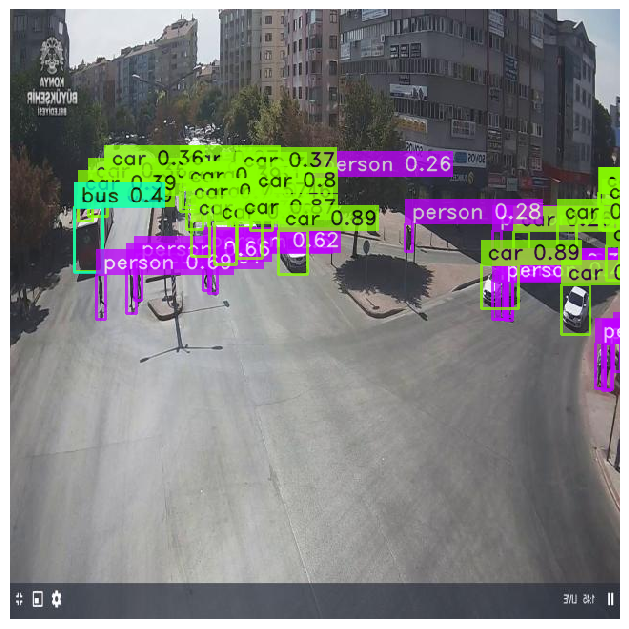

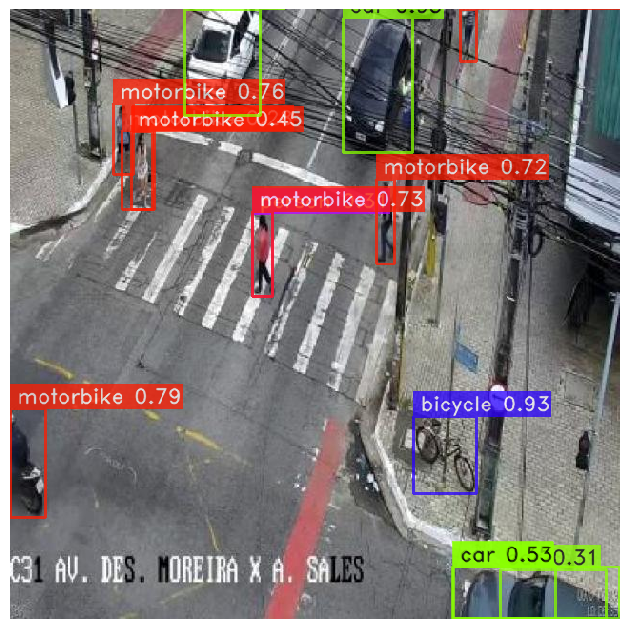

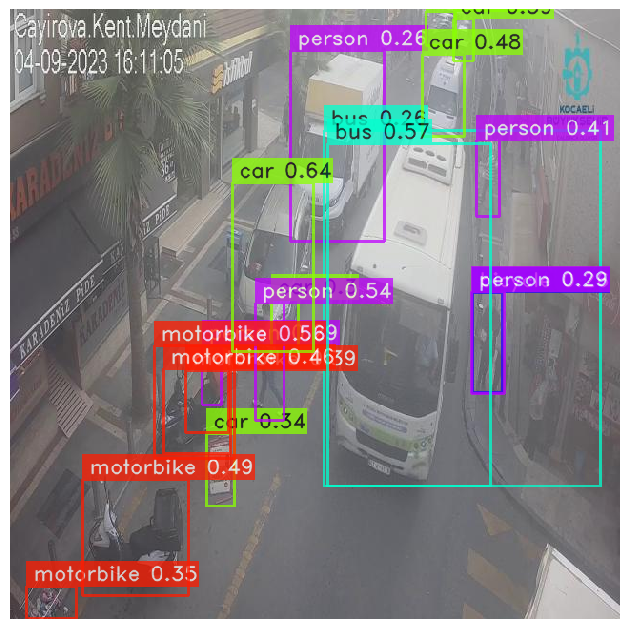

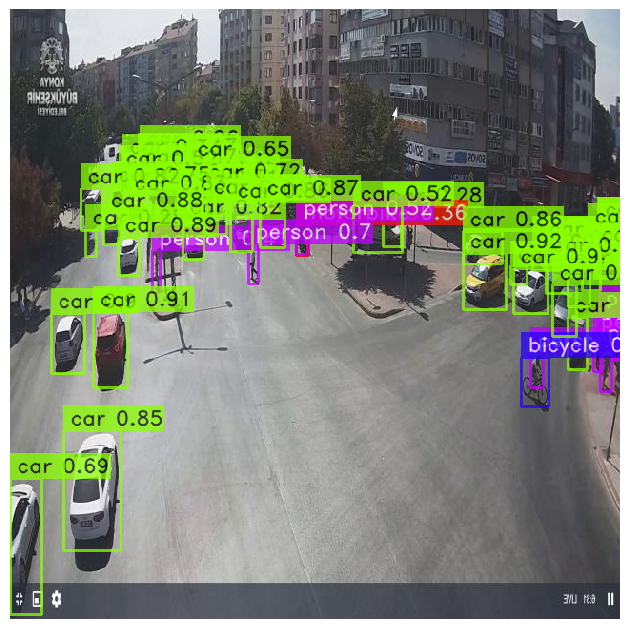

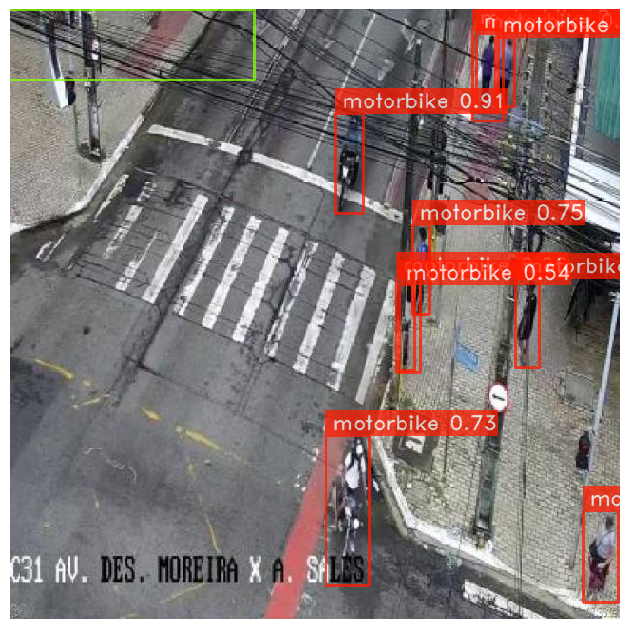

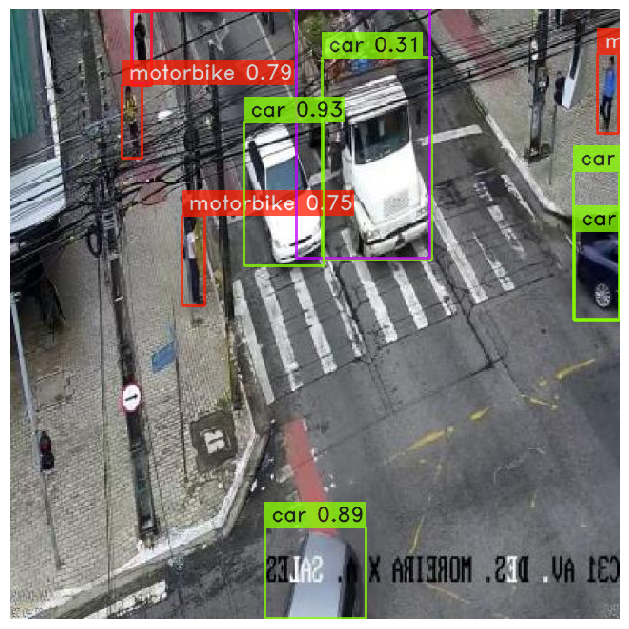

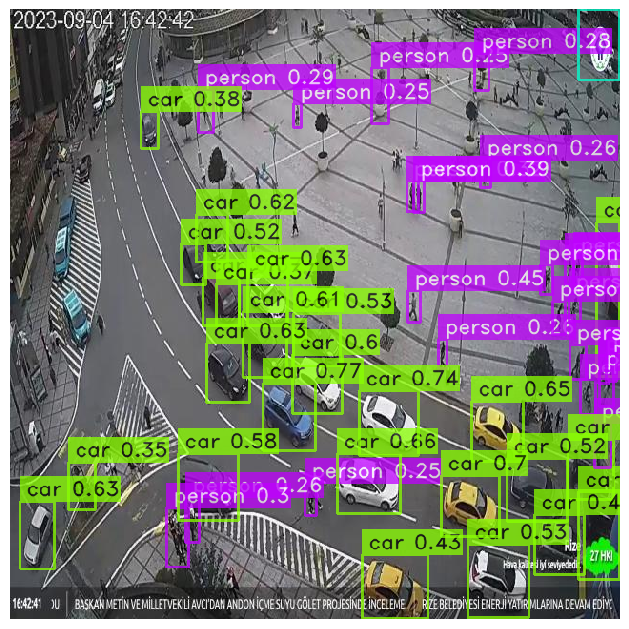

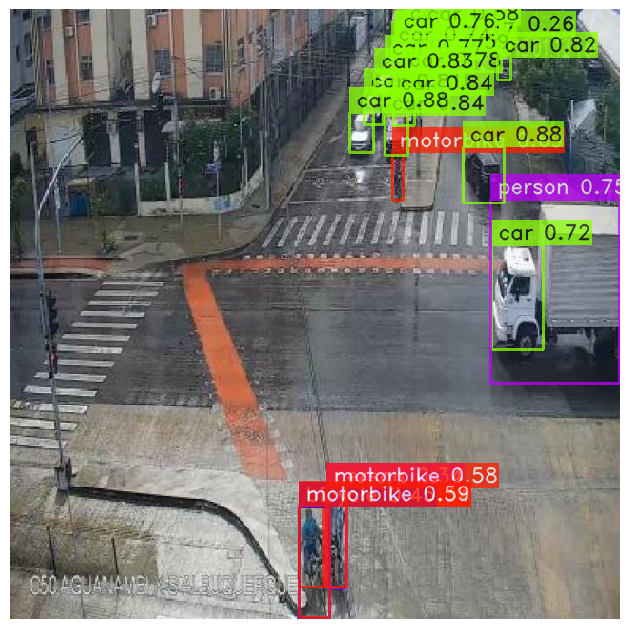

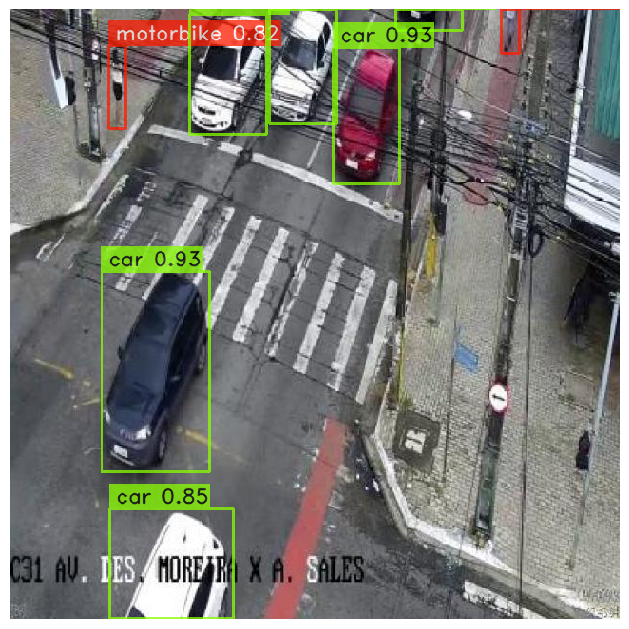

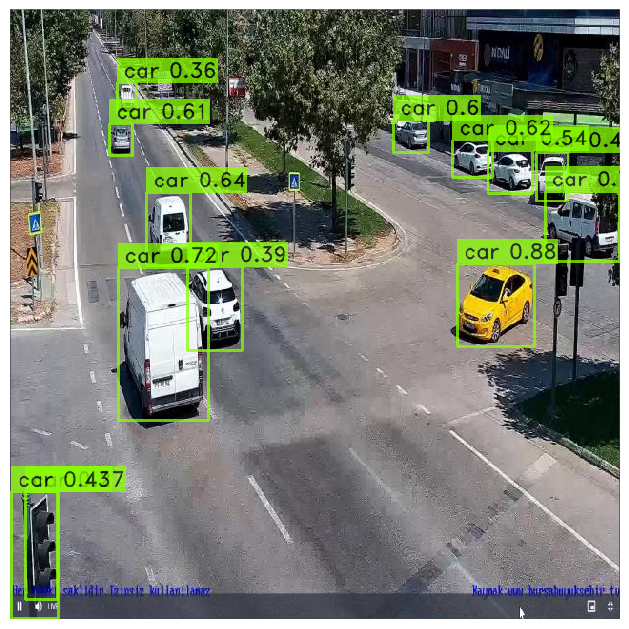

In [ ]:
# Test Predictions
tpaths = [os.path.join(dirname, filename) for dirname, _, filenames in os.walk('/kaggle/input/traffic-detection-project/test/images') for filename in filenames]
tpaths_sample = random.sample(tpaths, 10)
best_model.predict(tpaths_sample, conf=0.25).show()

Predicting Images: 100%|██████████| 10/10 [00:13<00:00,  1.40s/it]


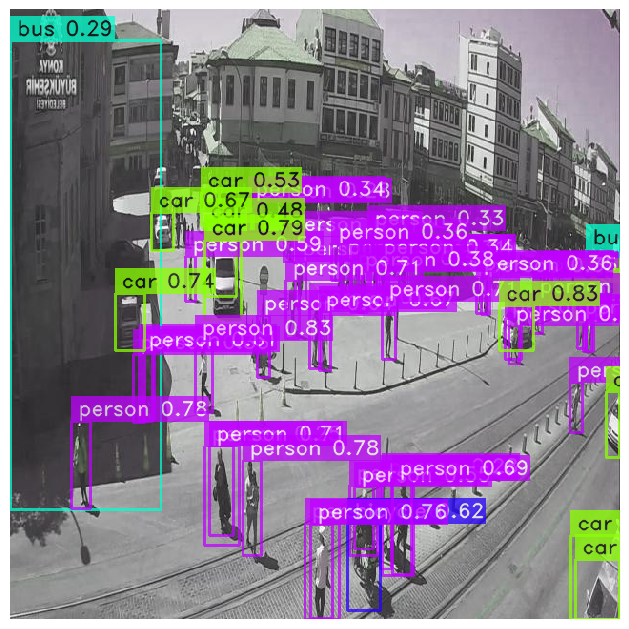

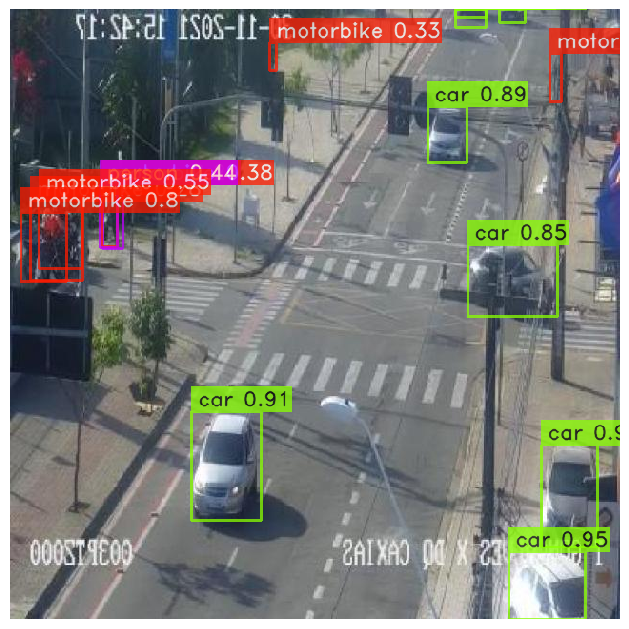

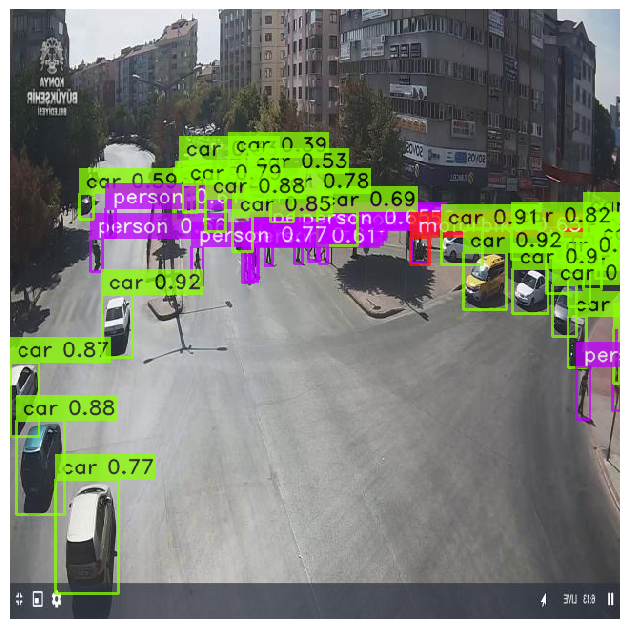

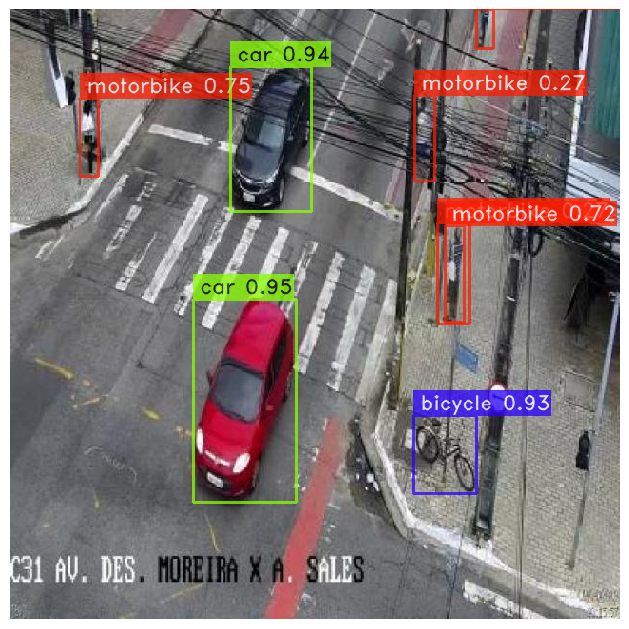

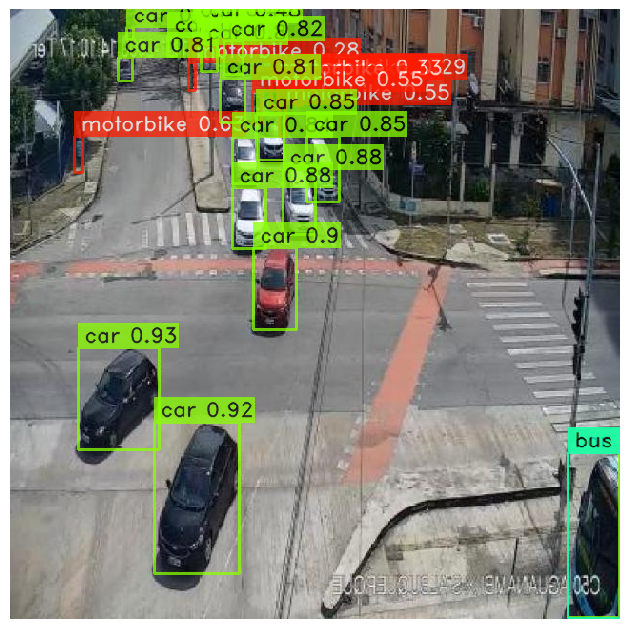

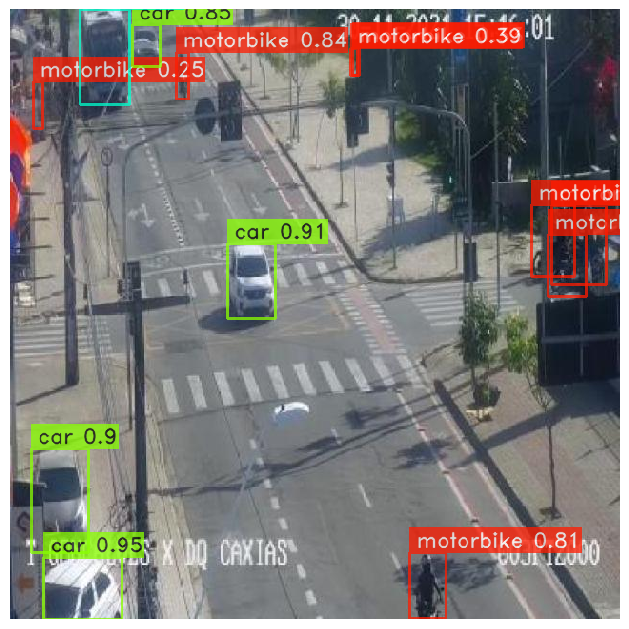

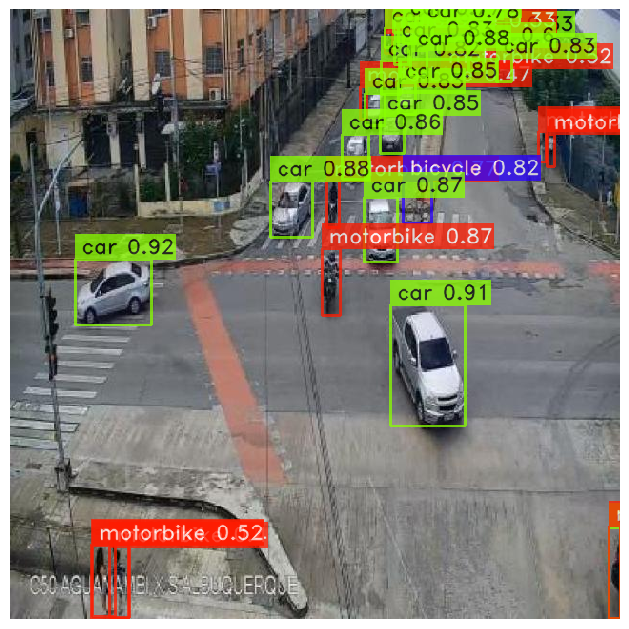

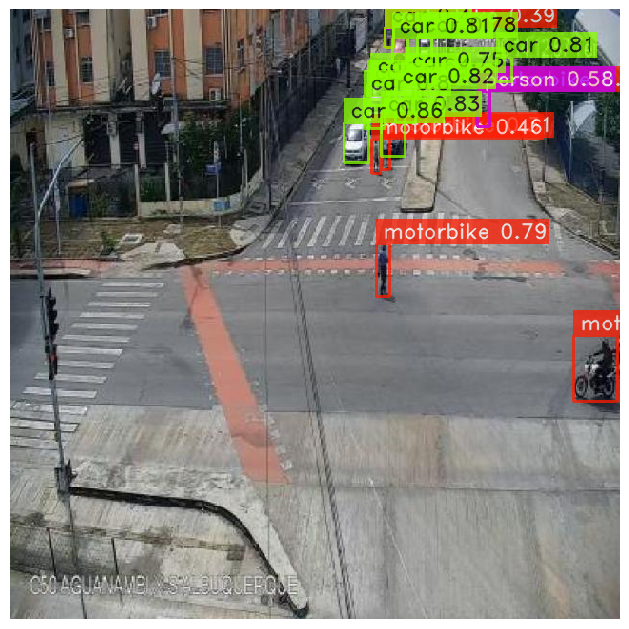

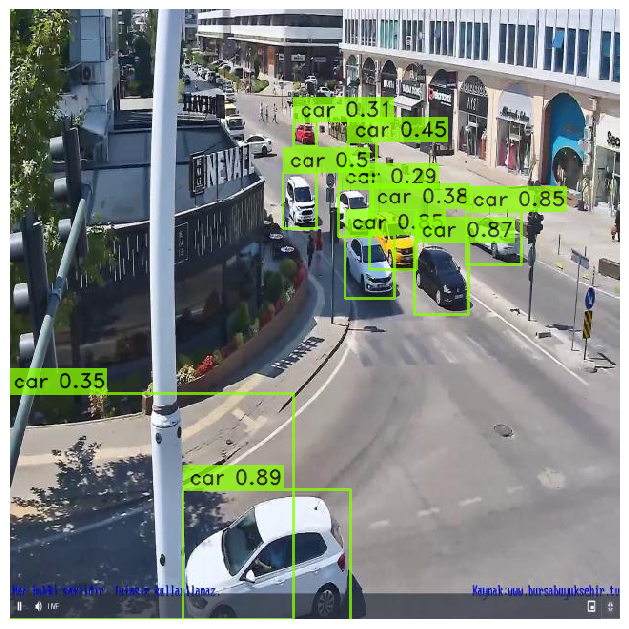

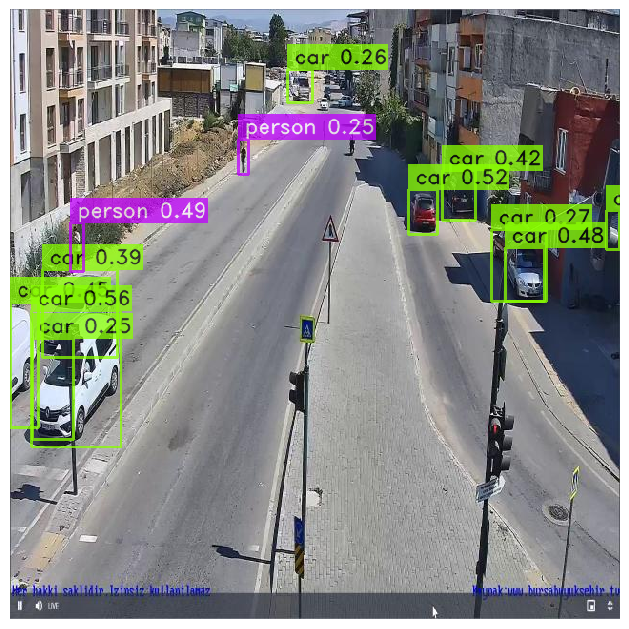

In [ ]:
# Quantize the best model
def quantize_model(model):
    quantized_model = torch.quantization.quantize_dynamic(
        model, {torch.nn.Linear}, dtype=torch.qint8
    )
    return quantized_model

best_model_quantized = quantize_model(best_model)
tpaths_sample = random.sample(tpaths, 10)
best_model_quantized.predict(tpaths_sample, conf=0.25).show()

The output shows detected objects like "car," "person," "bus," and confidence scores associated with each prediction. For instance, "car 0.36" indicates a detected car with a confidence score of 0.36, and "person 0.69" denotes a person detected with a confidence score of 0.69. However, there are some inconsistencies and anomalies in the output, such as "car o car 0.8," which might indicate a formatting issue or a misclassification, and "char 0.89 lost char," which seems to be an erroneous detection or misinterpretation of the input image.

#Conclusion

The model demonstrates its capability to detect various objects such as cars, persons, and buses with associated confidence scores, aiding in object recognition tasks. This functionality is crucial for solving problems related to traffic detection and monitoring. The model's ability to detect specific objects like cars and persons with relatively high confidence scores, despite some anomalies in the output, suggests its potential to contribute effectively to tasks like traffic surveillance, vehicle counting, and pedestrian detection.